In [104]:
import numpy as np 
import pandas as pd 
import os
import matplotlib.pyplot as plt

os.chdir("/Users/jacobrichards/Desktop/DS_DA_Projects/Marketing_Prediction")

data = pd.read_csv("data.csv", na_values=["", "NA"])

import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = [8, 6]  # Default figure size
plt.rcParams['figure.dpi'] = 100  # Controls display resolution

# Investigation of Logistic Regression model performance

In diagnosing why the Logistic Regression model failed to make accurate predictions, we can study first-hand the best practices and proper utilization of the method. 

We are investigating the model’s poor performance using the following data set. The variable “target” will serve as the response, and all other columns (except for “id”) will be used as predictors.

How do factors like age, distance, gender, income, and marital status quantitatively influence the likelihood of someone responding to an advertising campaign?

In [105]:
print(data.head())

   id  age      dist       income gender marital_status  target
0   1   73  4.371654    90-99,999      M              S       1
1   2   89  1.582733  100-149,999      M            NaN       1
2   3   85  1.223810    10-19,999      F              S       1
3   4   76  2.962427    90-99,999      M              M       1
4   5   76  2.594408    10-19,999      M              S       1


# prepare data

In [106]:
import pandas as pd
import numpy as np

# Replace missing or empty values in columns 4, 5, 6 with "unknown"
data.iloc[:, [3, 4, 5]] = data.iloc[:, [3, 4, 5]].applymap(lambda x: "unknown" if pd.isna(x) or x == "" else x)

# Replace income with appropriate midpoints or custom values
income_mapping = {
    "unknown": 6,              # replacing unknown with the median income level
    "Under $10k": 1,            # midpoint of "Under $10k"
    "10-19,999": 2,            # midpoint of "10-19,999"
    "20-29,999": 3,            # midpoint of "20-29,999"
    "30-39,999": 4,            # midpoint of "30-39,999"
    "40-49,999": 5,            # midpoint of "40-49,999"
    "50-59,999": 6,            # midpoint of "50-59,999"
    "60-69,999": 7,            # midpoint of "60-69,999"
    "70-79,999": 8,            # midpoint of "70-79,999"
    "80-89,999": 9,            # midpoint of "80-89,999"
    "90-99,999": 10,            # midpoint of "90-99,999"
    "100-149,999": 11,         # midpoint of "100-149,999"
    "150 - 174,999": 12,       # midpoint of "150 - 174,999"
    "175 - 199,999": 13,       # midpoint of "175 - 199,999"
    "200 - 249,999": 14,       # midpoint of "200 - 249,999"
    "250k+": 15               # custom value for "250k+"
}
data["income"] = data["income"].map(income_mapping).astype(int)

# Replace gender with 1 for male, 0 for female, and 0 for unknown
gender_mapping = {"M": 1, "F": 0, "unknown": 0}
data["gender"] = data["gender"].map(gender_mapping).astype(int)

# Replace marital_status with 1 for married, 0 for single, and 1 for unknown
marital_status_mapping = {"M": 1, "S": 0, "unknown": 1}
data["marital_status"] = data["marital_status"].map(marital_status_mapping).astype(int)

# Convert target to categorical values (0 or 1)
data["target"] = data["target"].astype(int)

# Convert distance (dist) column to integer
data["dist"] = data["dist"].astype(int)

Male is 1 and female is 0, married is 1 and single is 0, finally, response is 1 and no response is 0. 

In [107]:
print(data.head())

   id  age  dist  income  gender  marital_status  target
0   1   73     4      10       1               0       1
1   2   89     1      11       1               1       1
2   3   85     1       2       0               0       1
3   4   76     2      10       1               1       1
4   5   76     2       2       1               0       1


# Evaluate Logistic Regression

Optimization terminated successfully.
         Current function value: 0.521321
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:                 target   No. Observations:                 3200
Model:                          Logit   Df Residuals:                     3194
Method:                           MLE   Df Model:                            5
Date:                Sun, 29 Dec 2024   Pseudo R-squ.:                 0.06309
Time:                        11:28:06   Log-Likelihood:                -1668.2
converged:                       True   LL-Null:                       -1780.6
Covariance Type:            nonrobust   LLR p-value:                 1.494e-46
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -4.5569      0.453    -10.067      0.000      -5.444      -3.670
age              

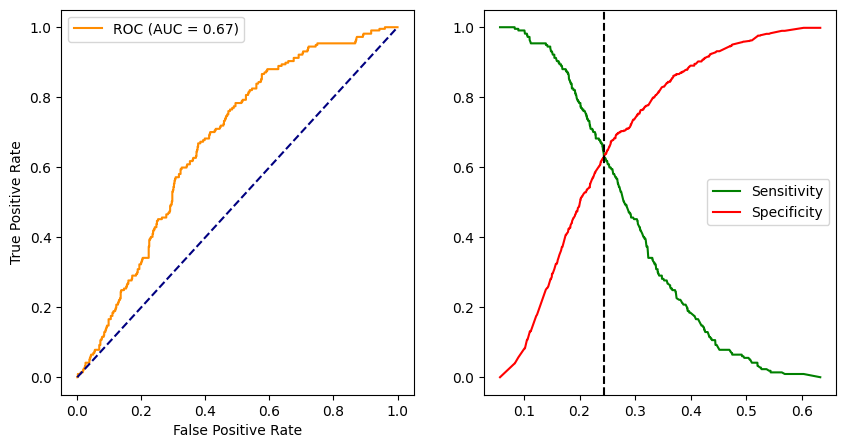

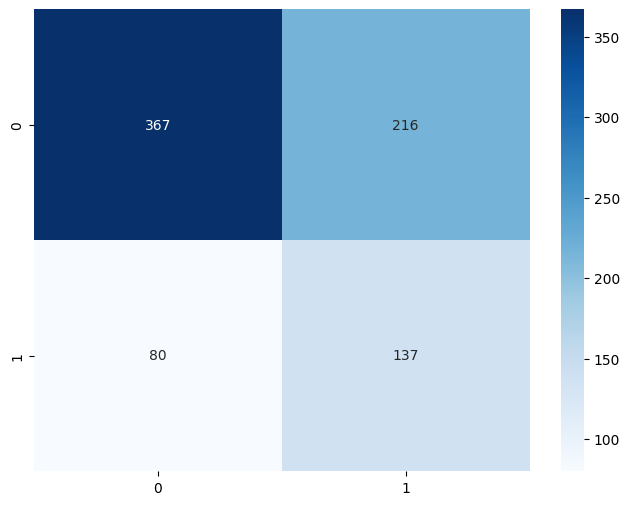

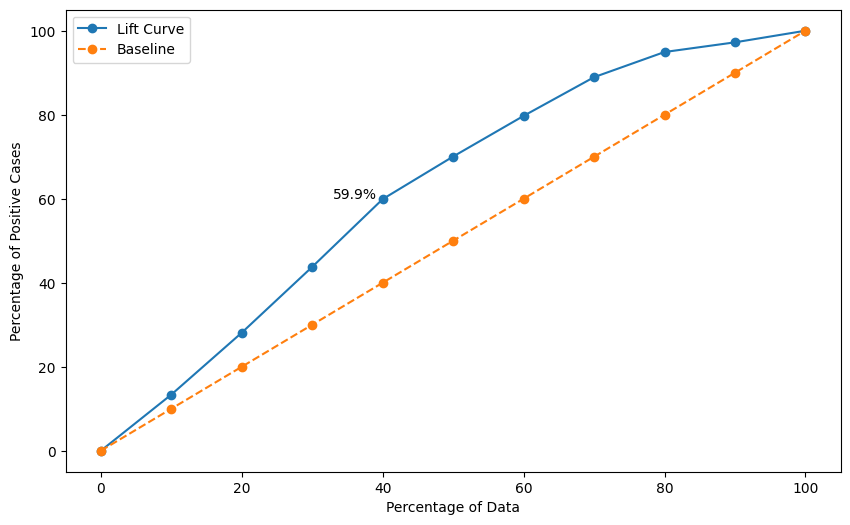

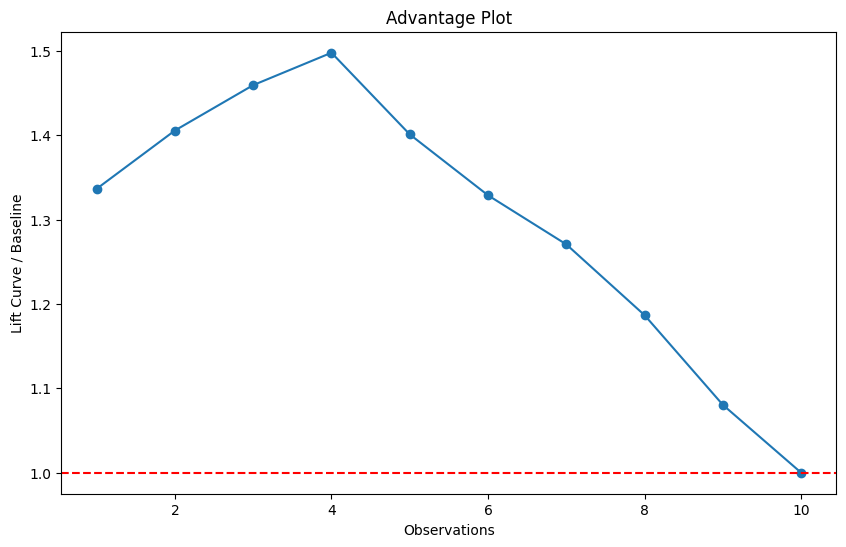


Top predictions:
      target  predicted_probs
862        0         0.633214
61         1         0.618815
99         1         0.603302
889        0         0.596886
2304       0         0.591494
      target  predicted_probs
2335       0         0.080402
3722       0         0.206425
3379       0         0.474748
2313       0         0.144285
3782       0         0.355865


In [108]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.metrics import roc_curve, auc, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

X = sm.add_constant(data[['age', 'dist', 'income', 'gender', 'marital_status']])
y = data['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = sm.Logit(y_train, X_train).fit()
y_pred_proba = model.predict(X_test)

print(model.summary())
print(f"\nTraining Accuracy: {(model.predict(X_train) > 0.5).mean():.3f}")
print(f"Testing Accuracy: {(y_pred_proba > 0.5).mean():.3f}")

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
optimal_threshold = thresholds[np.argmin(np.abs(tpr - (1-fpr)))]
y_pred_optimal = (y_pred_proba >= optimal_threshold).astype(int)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.plot(fpr, tpr, color='darkorange', label=f'ROC (AUC = {auc(fpr, tpr):.2f})')
ax1.plot([0, 1], [0, 1], color='navy', linestyle='--')
ax1.set_xlabel('False Positive Rate')
ax1.set_ylabel('True Positive Rate')
ax1.legend()

ax2.plot(thresholds, tpr, label='Sensitivity', color='green')
ax2.plot(thresholds, 1-fpr, label='Specificity', color='red')
ax2.axvline(x=optimal_threshold, color='black', linestyle='--')
ax2.legend()
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_pred_optimal), annot=True, fmt='d', cmap='Blues')
plt.show()

y_pred_proba_test = model.predict(X_test)
test_data = pd.DataFrame({'target': y_test, 'predicted_probs': y_pred_proba_test})
test_data_sorted = test_data.sort_values('predicted_probs', ascending=False)

total_pos = test_data_sorted['target'].sum()
n_rows = len(test_data_sorted)
deciles = np.linspace(0, n_rows, 11, dtype=int)
lift_curve = [test_data_sorted.iloc[:i]['target'].sum() / total_pos * 100 for i in deciles]
baseline = np.linspace(0, 100, 11)

plt.figure(figsize=(10, 6))
plt.plot(baseline, lift_curve, label='Lift Curve', marker='o')
plt.plot(baseline, baseline, label='Baseline', linestyle='--', marker='o')
plt.text(33, lift_curve[4], f'{lift_curve[4]:.1f}%', fontsize=10)
plt.xlabel('Percentage of Data')
plt.ylabel('Percentage of Positive Cases')
plt.legend()
plt.show()

lift_data = pd.DataFrame({
    'Lift Curve': lift_curve,
    'Baseline': baseline
})

plt.figure(figsize=(10, 6))
plt.plot(range(11), lift_data['Lift Curve'] / lift_data['Baseline'], marker='o')
plt.axhline(y=1, color='r', linestyle='--')
plt.xlabel('Observations')
plt.ylabel('Lift Curve / Baseline')
plt.title('Advantage Plot')
plt.show()

print("\nTop predictions:")
print(test_data_sorted.head())
print(test_data.sample(5, random_state=42))

# Poor performance 

We used a Logistic Regression model to identify likely responders to an ad campaign and evaluated it using a lift (cumulative gains) chart, which shows the percentage of total responses captured for each percentage of customers contacted (contacted in order of greatest predicted response probability to least). 

The lift chart was chosen to evaluate the effectiveness of the model as it demonstrates the model’s predictive power independent of the choice of decision threshold. Unfortunately, the model only captured 60% of responses by contacting 40% of the customer base, this is only marginally better than random selection, which would capture 40%. This performance is inadequate.

# Evaluate Random Forest

Training Accuracy: 0.973
Testing Accuracy: 0.680


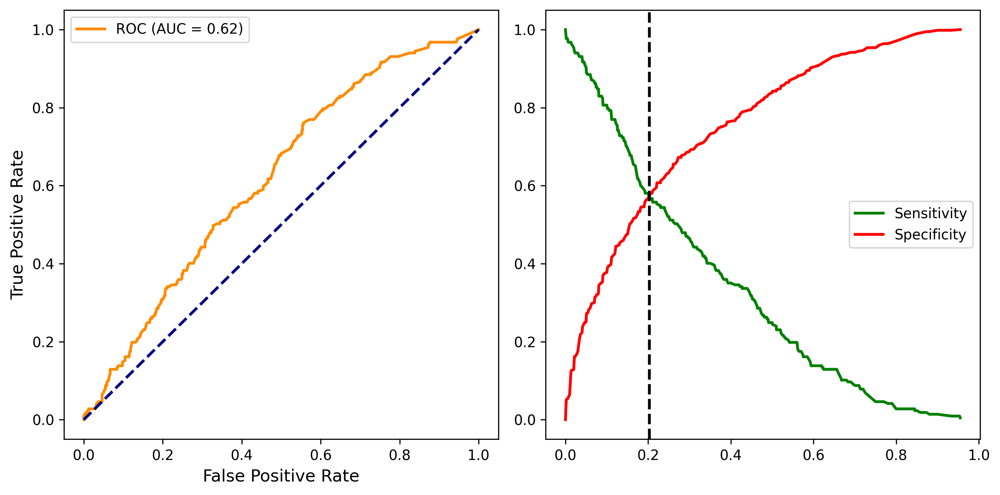

Optimal threshold: 0.203
Sensitivity: 0.567
Specificity: 0.576


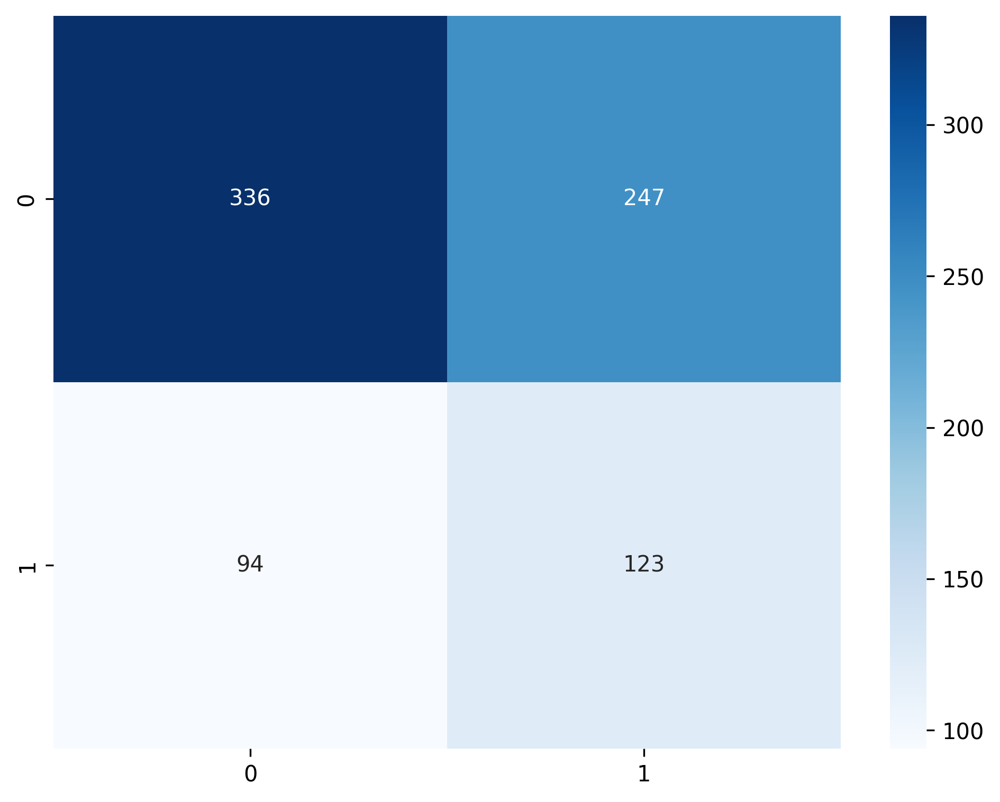

    Lift Curve  Baseline
0     0.000000         0
1    13.824885        10
2    26.267281        20
3    39.631336        30
4    51.152074        40
5    60.368664        50
6    73.271889        60
7    82.949309        70
8    91.705069        80
9    96.313364        90
10  100.000000       100


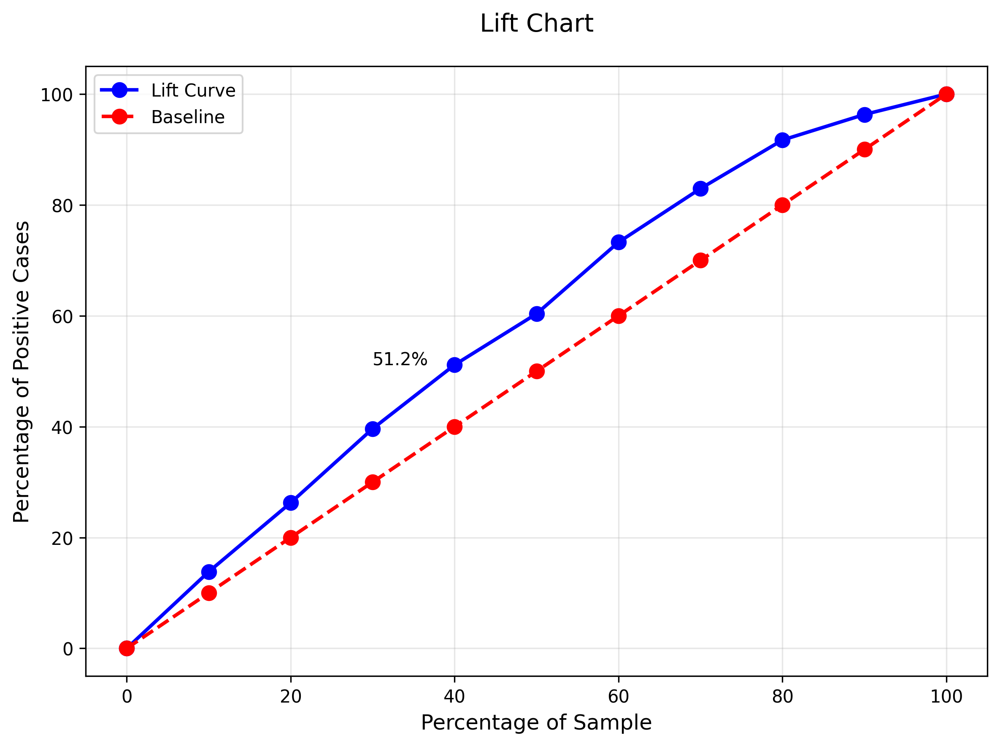

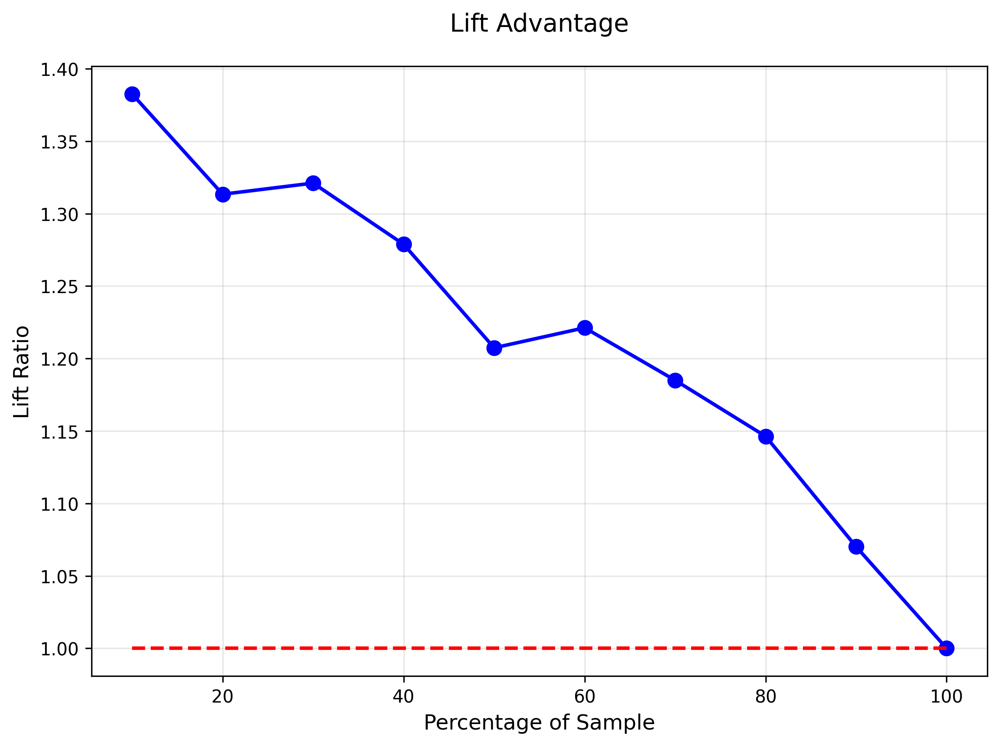

      target  predicted_probs
2643       1         0.955000
1091       1         0.953333
156        0         0.933333
2561       1         0.900000
3962       0         0.880000
      target  predicted_probs
2335       0         0.000000
3722       0         0.010000
3379       0         0.845000
2313       0         0.090714
3782       0         0.086667


In [109]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

X = data[['age', 'dist', 'income', 'gender', 'marital_status']]
y = data['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

print(f"Training Accuracy: {rf_model.score(X_train, y_train):.3f}")
print(f"Testing Accuracy: {rf_model.score(X_test, y_test):.3f}")

y_pred_proba = rf_model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
optimal_threshold = thresholds[np.argmin(np.abs(tpr - (1-fpr)))]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC (AUC = {auc(fpr, tpr):.2f})')
ax1.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
ax1.set_xlabel('False Positive Rate', fontsize=12)
ax1.set_ylabel('True Positive Rate', fontsize=12)
ax1.legend(fontsize=10)
ax1.tick_params(labelsize=10)

ax2.plot(thresholds, tpr, label='Sensitivity', color='green', lw=2)
ax2.plot(thresholds, 1-fpr, label='Specificity', color='red', lw=2)
ax2.axvline(x=optimal_threshold, color='black', linestyle='--', lw=2)
ax2.legend(fontsize=10)
ax2.tick_params(labelsize=10)
plt.tight_layout()
plt.show()

print(f"Optimal threshold: {optimal_threshold:.3f}")
print(f"Sensitivity: {tpr[np.argmin(np.abs(tpr - (1-fpr)))]:.3f}")
print(f"Specificity: {1-fpr[np.argmin(np.abs(tpr - (1-fpr)))]:.3f}")

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, (y_pred_proba >= optimal_threshold).astype(int)), annot=True, fmt='d', cmap='Blues')
plt.show()

test_data = pd.DataFrame({'target': y_test, 'predicted_probs': y_pred_proba})
test_data_sorted = test_data.sort_values(by='predicted_probs', ascending=False)
total_positives = test_data_sorted['target'].sum()
n_rows = len(test_data_sorted)

lift_curve = [(test_data_sorted.iloc[:int((i/10)*n_rows)]['target'].sum() / total_positives * 100) for i in range(11)]
baseline_curve = [i*10 for i in range(11)]
lift_data = pd.DataFrame({'Lift Curve': lift_curve, 'Baseline': baseline_curve})
print(lift_data)

plt.figure(figsize=(8, 6))
plt.plot(range(0, 101, 10), lift_curve, label='Lift Curve', color='blue', marker='o', lw=2, markersize=8)
plt.plot(range(0, 101, 10), baseline_curve, label='Baseline', color='red', linestyle='--', marker='o', lw=2, markersize=8)
plt.text(30, lift_curve[4], f'{lift_curve[4]:.1f}%', fontsize=10)
plt.xlabel('Percentage of Sample', fontsize=12)
plt.ylabel('Percentage of Positive Cases', fontsize=12)
plt.title('Lift Chart', fontsize=14, pad=20)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.tick_params(labelsize=10)
plt.tight_layout()
plt.show()

advantage_data = pd.DataFrame({'Lift': np.array(lift_curve[1:])/np.array(baseline_curve[1:])})
plt.figure(figsize=(8, 6))
plt.plot(range(10, 101, 10), advantage_data['Lift'], color='blue', marker='o', lw=2, markersize=8)
plt.plot(range(10, 101, 10), [1]*10, color='red', linestyle='--', lw=2)
plt.xlabel('Percentage of Sample', fontsize=12)
plt.ylabel('Lift Ratio', fontsize=12)
plt.title('Lift Advantage', fontsize=14, pad=20)
plt.grid(True, alpha=0.3)
plt.tick_params(labelsize=10)
plt.tight_layout()
plt.show()

print(test_data_sorted.head())
print(test_data.sample(frac=1, random_state=42).head())

## good performance 

Within sampling only 30% of potential customers, Random Forest obtained 90% of total customer responses. Which begs the question, why exactly does this model predict customers so well while Logistic Regression predicts so poorly. To begin to answer this, we examine the data the models are using to produce predictions. 

## Examination of predictor variables

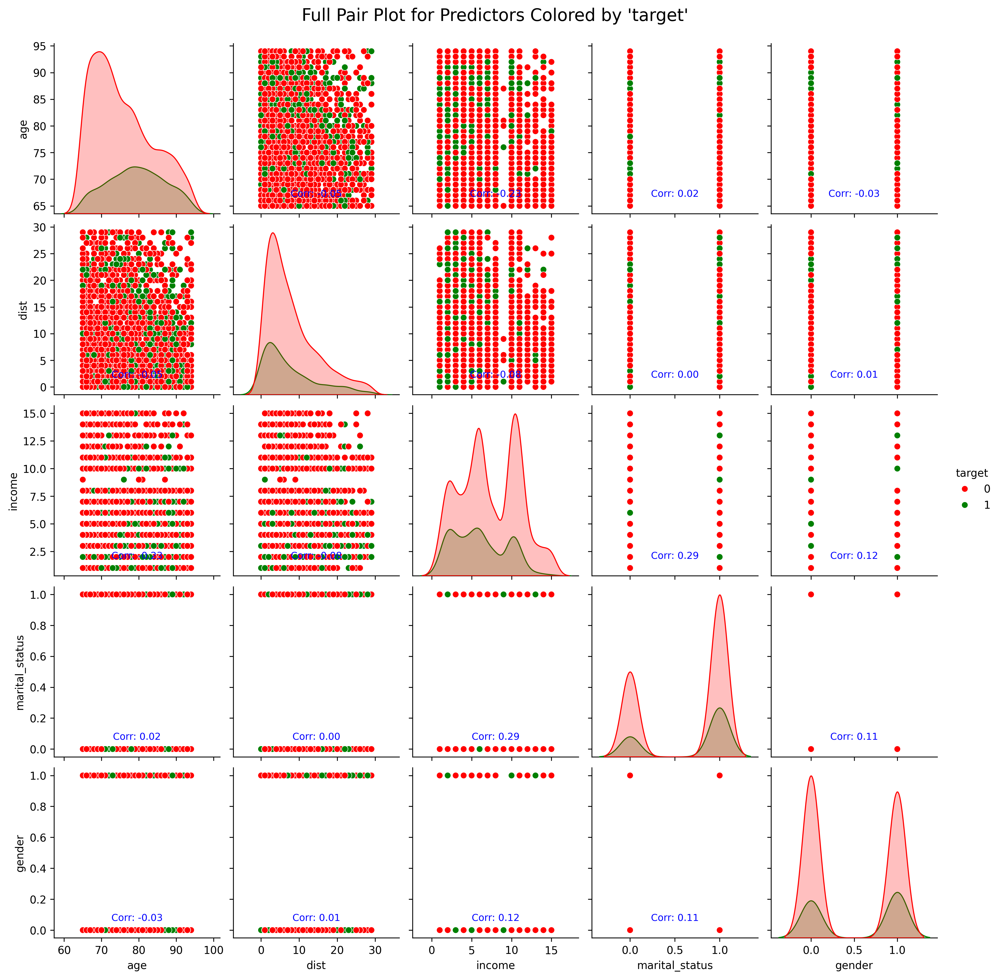

In [110]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_full_pairplot_with_corr_binary_target(df, continuous_vars, target_var='target', positive_value=1, negative_value=0):
    pairplot_data = df[continuous_vars + [target_var]].copy()
    pairplot_data[target_var] = pairplot_data[target_var].astype('category')
    correlation_matrix = pairplot_data[continuous_vars].corr()
    g = sns.pairplot(pairplot_data, hue=target_var, palette={positive_value: 'green', negative_value: 'red'}, diag_kind='kde', corner=False)
    for i, row_var in enumerate(continuous_vars):
        for j, col_var in enumerate(continuous_vars):
            if i != j:
                g.axes[i, j].annotate(f"Corr: {correlation_matrix.loc[row_var, col_var]:.2f}", xy=(0.5, 0.1), xycoords="axes fraction", ha="center", fontsize=9, color="blue")
    plt.suptitle(f"Full Pair Plot for Predictors Colored by '{target_var}'", y=1.02, fontsize=16)
    plt.show()

plot_full_pairplot_with_corr_binary_target(data, ['age', 'dist', 'income', 'marital_status', 'gender'], 'target')

Across the diagonal are the distribution curves of the predictor variables divided into groups of values which correspond to positive or negative responses within observations.

The plots off the main diagonal are scatterplots of the predictor variables. Green dots represent observations (customers) that responded where it's x-y coordinates are the values of the predictor variables. 

In [111]:
print(data.head(1))

   id  age  dist  income  gender  marital_status  target
0   1   73     4      10       1               0       1


### Examination of variable distributions divided by positive and negative responses

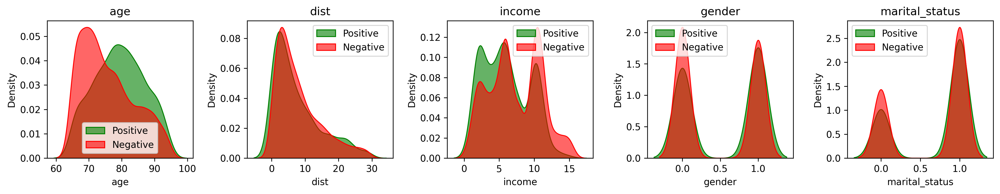

In [112]:
fig, axes = plt.subplots(1, 5, figsize=(15, 3))
variables = ['age', 'dist', 'income', 'gender', 'marital_status']

for i, var in enumerate(variables):
    sns.kdeplot(data=data[data['target'] == 1], x=var, ax=axes[i], 
                fill=True, alpha=0.6, label='Positive', color='green')
    sns.kdeplot(data=data[data['target'] == 0], x=var, ax=axes[i],
                fill=True, alpha=0.6, label='Negative', color='red')
    axes[i].set_title(var)
    axes[i].legend()

plt.tight_layout()
plt.show()

In visual examination of the density curves divided by positive and negative outcomes, significant differences between the response and no response groups are most visually evident within age and income. 

We are examining how the variables within each observation (customer) are associated with the customer’s response. Ideally, we would like to isolate the effect of each variable on whether or not a customer will respond. However, the information we have available is how groups of these variables correspond to wether or not the customer responds, as these are simply measurements taken of individuals. 

In [113]:
print(data.head(1))

   id  age  dist  income  gender  marital_status  target
0   1   73     4      10       1               0       1


Consequently, all these plots demonstrate is how these variables are associated with positive responses in the context where it is only one of the variables that is/could be effecting wether or not a customer responds to advertising.

We see that the density curves of Age and Income are the most distinct, so we take a closer look.

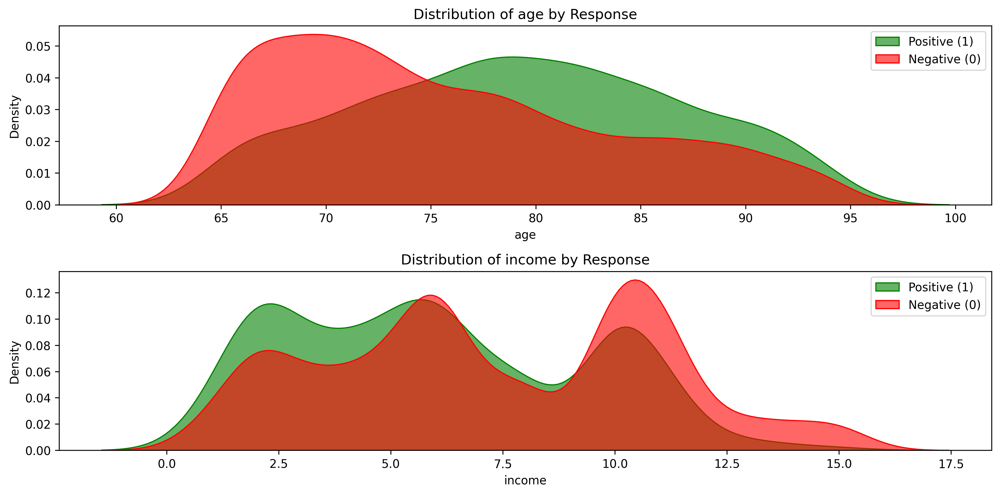

In [114]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def ridge_plot_by_response(df, variables, categorical_var='target', positive_value=1, negative_value=0):
    plt.figure(figsize=(12, 6))
    
    for i, var in enumerate(variables):
        plt.subplot(2, 1, i + 1)
        
        sns.kdeplot(data=df[df[categorical_var] == positive_value], x=var, 
                    fill=True, alpha=0.6, label=f'Positive ({positive_value})', color='green')
        
        sns.kdeplot(data=df[df[categorical_var] == negative_value], x=var, 
                    fill=True, alpha=0.6, label=f'Negative ({negative_value})', color='red')
        
        plt.title(f'Distribution of {var} by Response')
        plt.xlabel(var)
        plt.ylabel('Density')
        plt.legend()
    
    plt.tight_layout()
    plt.show()

variables = ['age', 'income']
ridge_plot_by_response(data, variables, categorical_var='target', positive_value=1, negative_value=0)

Keep in mind that the distribution curves here are dependent upon sample size in their ability to visualize the association between variable values and the status of customer response they correspond too. As the sample sizes of each age group are decreasing over the course of the data, further visualizations are required to isolate the relationship between the variables and customer response status.

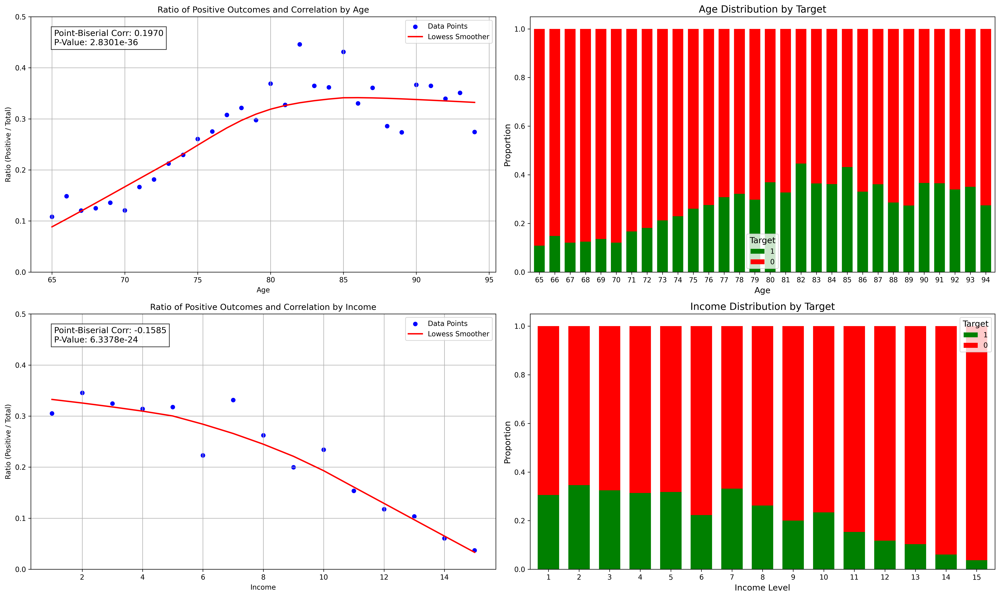

In [115]:
from scipy.stats import pointbiserialr

def plot_ratio_positive_negative_with_corr(df, continuous_var, categorical_var='target', positive_value=1, negative_value=0):
    grouped = df.groupby([continuous_var, categorical_var]).size().reset_index(name='count')
    pivot = grouped.pivot(index=continuous_var, columns=categorical_var, values='count').fillna(0)
    
    positive_counts = pivot[positive_value] if positive_value in pivot.columns else 0
    total_counts = positive_counts + pivot[negative_value] if negative_value in pivot.columns else positive_counts
    ratio = positive_counts / (total_counts + 1e-9)
    
    plot_df = pd.DataFrame({continuous_var: ratio.index, 'ratio_positive_negative': ratio.values})
    return plot_df, *pointbiserialr(df[continuous_var], df[categorical_var])

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 12))

age_plot_df, age_corr, age_p = plot_ratio_positive_negative_with_corr(data, 'age', 'target')
sns.scatterplot(x='age', y='ratio_positive_negative', data=age_plot_df, color='blue', s=50, label='Data Points', ax=ax1)
sns.regplot(x='age', y='ratio_positive_negative', data=age_plot_df, scatter=False, lowess=True, color='red', line_kws={'lw': 2}, label='Lowess Smoother', ax=ax1)
ax1.text(0.05, 0.95, f'Point-Biserial Corr: {age_corr:.4f}\nP-Value: {age_p:.4e}', transform=ax1.transAxes, fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))
ax1.set_title('Ratio of Positive Outcomes and Correlation by Age')
ax1.set_xlabel('Age')
ax1.set_ylabel('Ratio (Positive / Total)')
ax1.set_ylim(0, 0.50)
ax1.legend()
ax1.grid()

age_proportions = data.groupby(["age", "target"]).size().unstack(fill_value=0).apply(lambda x: x / x.sum(), axis=1)
age_proportions[[1, 0]].plot(kind="bar", stacked=True, ax=ax2, width=0.7, legend=True, color=['green', 'red'])
ax2.set_title("Age Distribution by Target", fontsize=14)
ax2.set_ylabel("Proportion", fontsize=12)
ax2.set_xlabel("Age", fontsize=12)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=0, ha='center')
ax2.legend(title="Target", title_fontsize=12, fontsize=10)

income_plot_df, income_corr, income_p = plot_ratio_positive_negative_with_corr(data, 'income', 'target')
sns.scatterplot(x='income', y='ratio_positive_negative', data=income_plot_df, color='blue', s=50, label='Data Points', ax=ax3)
sns.regplot(x='income', y='ratio_positive_negative', data=income_plot_df, scatter=False, lowess=True, color='red', line_kws={'lw': 2}, label='Lowess Smoother', ax=ax3)
ax3.text(0.05, 0.95, f'Point-Biserial Corr: {income_corr:.4f}\nP-Value: {income_p:.4e}', transform=ax3.transAxes, fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))
ax3.set_title('Ratio of Positive Outcomes and Correlation by Income')
ax3.set_xlabel('Income')
ax3.set_ylabel('Ratio (Positive / Total)')
ax3.set_ylim(0, 0.50)
ax3.legend()
ax3.grid()

income_proportions = data.groupby(["income", "target"]).size().unstack(fill_value=0).apply(lambda x: x / x.sum(), axis=1)
income_proportions[[1, 0]].plot(kind="bar", stacked=True, ax=ax4, width=0.7, legend=True, color=['green', 'red'])
ax4.set_title("Income Distribution by Target", fontsize=14)
ax4.set_ylabel("Proportion", fontsize=12)
ax4.set_xlabel("Income Level", fontsize=12)
ax4.set_xticklabels(ax4.get_xticklabels(), rotation=0, ha='center')
ax4.legend(title="Target", title_fontsize=12, fontsize=10)

plt.tight_layout()
plt.show()

Notice that the relationship between age and proportion of customers which responded to advertising is not linear, there is a peak around 80 to 85 followed by a subtle decline.

As these plots only visualize the relationship between a single dimension of an individual and the individual responding. Such plots are incapable of revealing minute trends within the data in which several variables intersect at values which are highly associated with positive response. As these are only "slices" of such trends and relationships.

With aim of revealing trends in the data present within higher dimensional cross sections of the variables rather than just one with respect to positive outcomes, we examine the scatter plot of variables divided by response outcome.

### Examination of the scatter plots 

The scatter plots display all possible combinations of two predictor variables and that combinations association with positive response as indicated by the points color. As we observed that Age and Income are individually the most associated with positive outcome, we analyze the scatter plot of these variables against each other looking for a pattern indicative of the variables having a combined effect. 

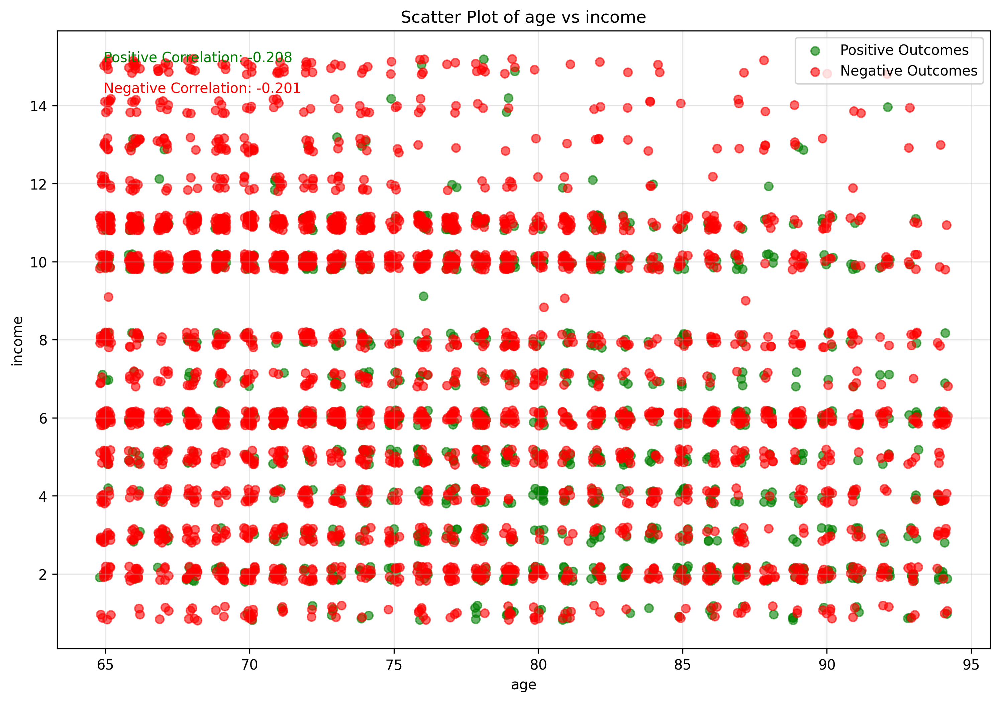

In [116]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_scatter_with_separate_correlations(df, continuous_vars, target_var='target', positive_value=1, negative_value=0):
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    
    positive_data = df[df[target_var] == positive_value]
    negative_data = df[df[target_var] == negative_value]
    
    pos_corr = positive_data[continuous_vars[0]].corr(positive_data[continuous_vars[1]])
    neg_corr = negative_data[continuous_vars[0]].corr(negative_data[continuous_vars[1]])
    
    offset = 0.2
    pos_x = positive_data[continuous_vars[0]] + np.random.uniform(-offset, offset, len(positive_data))
    pos_y = positive_data[continuous_vars[1]] + np.random.uniform(-offset, offset, len(positive_data))
    neg_x = negative_data[continuous_vars[0]] + np.random.uniform(-offset, offset, len(negative_data))
    neg_y = negative_data[continuous_vars[1]] + np.random.uniform(-offset, offset, len(negative_data))
    
    plt.scatter(pos_x, pos_y, color='green', label='Positive Outcomes', alpha=0.6)
    plt.scatter(neg_x, neg_y, color='red', label='Negative Outcomes', alpha=0.6)
    
    plt.text(0.05, 0.95, f'Positive Correlation: {pos_corr:.3f}',
             transform=ax.transAxes, color='green', fontsize=10)
    plt.text(0.05, 0.90, f'Negative Correlation: {neg_corr:.3f}',
             transform=ax.transAxes, color='red', fontsize=10)
    
    plt.title(f'Scatter Plot of {continuous_vars[0]} vs {continuous_vars[1]}')
    plt.xlabel(continuous_vars[0])
    plt.ylabel(continuous_vars[1])
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

continuous_vars = ['age', 'income']
target_var = 'target'

plot_scatter_with_separate_correlations(data, continuous_vars, target_var, positive_value=1, negative_value=0)

To clarify what this plot means, if you examine the intersection of age 80 and income level 4, you will see many customer responses, this is one of them.

In [117]:
print(data[(data['age'] == 80) & (data['income'] == 4)].head(1))

    id  age  dist  income  gender  marital_status  target
92  93   80     1       4       0               1       1


There fails to be a clear pattern of positive responses as age increases and income decreases within the crosssection of the variables across the entire span of the data.

The significance of these plots is that the manner in which we have analyses them is analogous to how logistic regression "analyses" them. It "looks" for broad trends, as such, indications that such trends are present in the data indicate that logistic regression would be a strong candidate to model the relationships of the variables. 

The following explanation of the logistic regression models mechanism of action explains exactly why the absence of strong-general trends in the data we were looking for make Logistic regression an unsuitable candidate to model the true relationships within it.

# How Logistic Regresion models these relationships

Optimization terminated successfully.
         Current function value: 0.527865
         Iterations 6


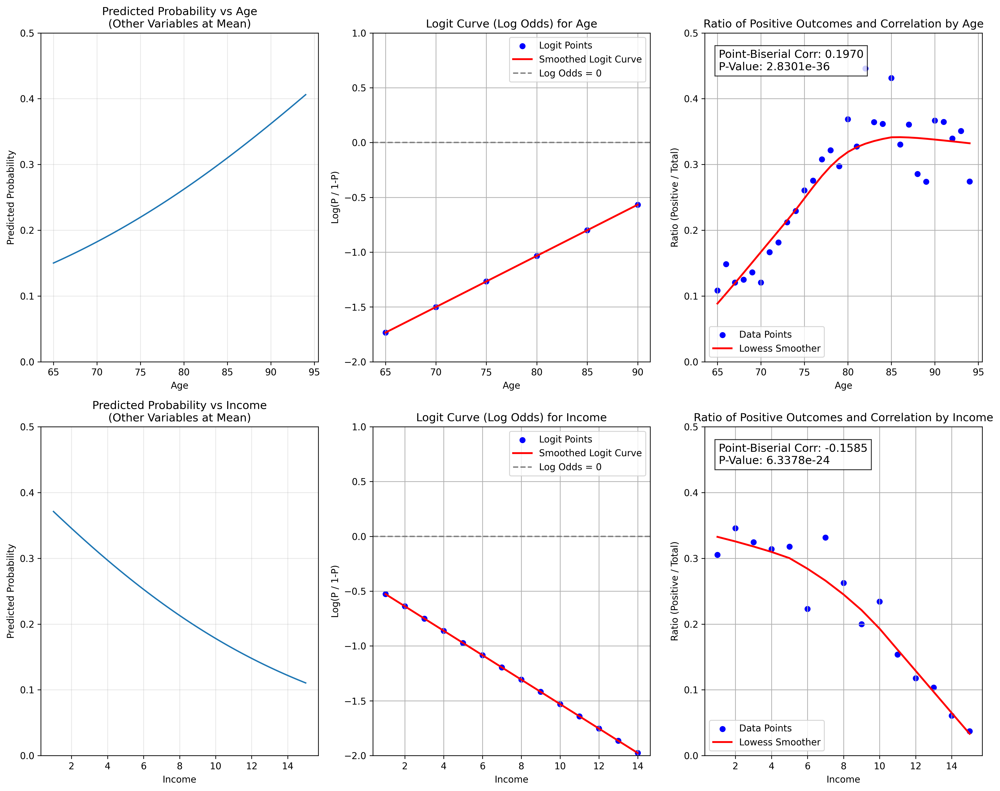

In [118]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import statsmodels.api as sm

X = data[['age', 'dist', 'income', 'gender', 'marital_status']]
y = data['target']

lr_model = LogisticRegression(random_state=42)
lr_model.fit(X, y)

fig, ((ax1, ax2, ax5), (ax3, ax4, ax6)) = plt.subplots(2, 3, figsize=(15, 12))

mean_values = X.mean()

x_range_age = np.linspace(X['age'].min(), X['age'].max(), 100)

pred_data_age = np.tile(mean_values, (100, 1))
pred_data_age = pd.DataFrame(pred_data_age, columns=X.columns)
pred_data_age['age'] = x_range_age

y_pred_age = lr_model.predict_proba(pred_data_age)[:, 1]

ax1.plot(x_range_age, y_pred_age)
ax1.set_title('Predicted Probability vs Age\n(Other Variables at Mean)')
ax1.set_ylabel('Predicted Probability')
ax1.set_xlabel('Age')
ax1.grid(True, alpha=0.3)
ax1.set_ylim(0, 0.5)

X_with_const = sm.add_constant(X)
logit_model = sm.Logit(y, X_with_const)
result = logit_model.fit()

feature_values_age = np.arange(X['age'].min(), X['age'].max(), 5)
fixed_predictors = mean_values.copy()
log_odds_age = []

for value in feature_values_age:
    temp_predictors = fixed_predictors.copy()
    temp_predictors['age'] = value
    predictors_with_const = sm.add_constant(temp_predictors.values.reshape(1, -1), has_constant='add')
    logit = np.dot(predictors_with_const, result.params)
    log_odds_age.append(logit[0])

plot_df_age = pd.DataFrame({
    'age': feature_values_age,
    'log_odds': log_odds_age
})

sns.scatterplot(x='age', y='log_odds', data=plot_df_age, color='blue', s=50, ax=ax2, label='Logit Points')
sns.regplot(x='age', y='log_odds', data=plot_df_age, scatter=False, lowess=True, 
            color='red', line_kws={'lw': 2}, ax=ax2, label='Smoothed Logit Curve')

ax2.set_title('Logit Curve (Log Odds) for Age')
ax2.set_xlabel('Age')
ax2.set_ylabel('Log(P / 1-P)')
ax2.set_ylim(-2, 1)
ax2.axhline(0, color='grey', linestyle='--', label='Log Odds = 0')
ax2.legend()
ax2.grid(True)

x_range_income = np.linspace(X['income'].min(), X['income'].max(), 100)

pred_data_income = np.tile(mean_values, (100, 1))
pred_data_income = pd.DataFrame(pred_data_income, columns=X.columns)
pred_data_income['income'] = x_range_income

y_pred_income = lr_model.predict_proba(pred_data_income)[:, 1]

ax3.plot(x_range_income, y_pred_income)
ax3.set_title('Predicted Probability vs Income\n(Other Variables at Mean)')
ax3.set_ylabel('Predicted Probability')
ax3.set_xlabel('Income')
ax3.grid(True, alpha=0.3)
ax3.set_ylim(0, 0.5)

feature_values_income = np.arange(X['income'].min(), X['income'].max(), 1)
fixed_predictors = mean_values.copy()
log_odds_income = []

for value in feature_values_income:
    temp_predictors = fixed_predictors.copy()
    temp_predictors['income'] = value
    predictors_with_const = sm.add_constant(temp_predictors.values.reshape(1, -1), has_constant='add')
    logit = np.dot(predictors_with_const, result.params)
    log_odds_income.append(logit[0])

plot_df_income = pd.DataFrame({
    'income': feature_values_income,
    'log_odds': log_odds_income
})

sns.scatterplot(x='income', y='log_odds', data=plot_df_income, color='blue', s=50, ax=ax4, label='Logit Points')
sns.regplot(x='income', y='log_odds', data=plot_df_income, scatter=False, lowess=True, 
            color='red', line_kws={'lw': 2}, ax=ax4, label='Smoothed Logit Curve')

ax4.set_title('Logit Curve (Log Odds) for Income')
ax4.set_xlabel('Income')
ax4.set_ylabel('Log(P / 1-P)')
ax4.set_ylim(-2, 1)
ax4.axhline(0, color='grey', linestyle='--', label='Log Odds = 0')
ax4.legend()
ax4.grid(True)

age_plot_df, age_corr, age_p = plot_ratio_positive_negative_with_corr(data, 'age', 'target')
sns.scatterplot(x='age', y='ratio_positive_negative', data=age_plot_df, color='blue', s=50, label='Data Points', ax=ax5)
sns.regplot(x='age', y='ratio_positive_negative', data=age_plot_df, scatter=False, lowess=True, color='red', line_kws={'lw': 2}, label='Lowess Smoother', ax=ax5)
ax5.text(0.05, 0.95, f'Point-Biserial Corr: {age_corr:.4f}\nP-Value: {age_p:.4e}', transform=ax5.transAxes, fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))
ax5.set_title('Ratio of Positive Outcomes and Correlation by Age')
ax5.set_xlabel('Age')
ax5.set_ylabel('Ratio (Positive / Total)')
ax5.set_ylim(0, 0.50)
ax5.legend()
ax5.grid()

income_plot_df, income_corr, income_p = plot_ratio_positive_negative_with_corr(data, 'income', 'target')
sns.scatterplot(x='income', y='ratio_positive_negative', data=income_plot_df, color='blue', s=50, label='Data Points', ax=ax6)
sns.regplot(x='income', y='ratio_positive_negative', data=income_plot_df, scatter=False, lowess=True, color='red', line_kws={'lw': 2}, label='Lowess Smoother', ax=ax6)
ax6.text(0.05, 0.95, f'Point-Biserial Corr: {income_corr:.4f}\nP-Value: {income_p:.4e}', transform=ax6.transAxes, fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))
ax6.set_title('Ratio of Positive Outcomes and Correlation by Income')
ax6.set_xlabel('Income')
ax6.set_ylabel('Ratio (Positive / Total)')
ax6.set_ylim(0, 0.50)
ax6.legend()
ax6.grid()

plt.tight_layout()
plt.show()

##### The predicted probability curve on the left is produced simply by plotting the logistic model equation while holding all other variables at their mean value. Notice how similar it is to simply the plot of the observed probability of response present in the data set.

Just as Linear Regression models response as a linear function of predictor by the coefficients which produce a best fit between predicted response and actual response for every observation of the data. 

### $y = \beta_0 + \beta_1x$
### where $\beta_0,\beta_1$ yields a "best fit" of $y$ and $\hat{y}$
### 
### Logistic Regression likewise models by a similar approach
### 
### $\log(\frac{p}{1-p}) = \beta_0 + \beta_1x$
### 
### $\frac{p}{1-p} = e^{\beta_0 + \beta_1x}$
### 
### $p = (e^{\beta_0 + \beta_1x})(1-p)$
### 
### $p = (e^{\beta_0 + \beta_1x}) - p(e^{\beta_0 + \beta_1x})$
### 
### $p + p(e^{\beta_0 + \beta_1x}) = e^{\beta_0 + \beta_1x}$
### 
### $p(1 + e^{\beta_0 + \beta_1x}) = e^{\beta_0 + \beta_1x}$
### 
### $p = \frac{e^{\beta_0 + \beta_1x}}{1 + e^{\beta_0 + \beta_1x}}$
### 
### where $\beta_0,\beta_1$ yields best fit of $p$ and $\hat{p}$


Thus, probability is not a linear function of the variables and coefficients, but it will be modeled in a similar fashion in that it's fitting the coefficients of a linear equation to probability that produces a best fit of the entire data set.

It is in this sense that Logistic Regression can be understood as an extension of Linear Regression, especially in having similar limitations and requiring characteristics of the data be satisfied in order to produce meaningful results.

#### **In essence, the model looks at each variable and compares it to the result for every observation and quantifies how much the change in each variable effected the result. The resulting probability for any observation is thus the sum of each variables estimated contribution towards the outcome**

From this understanding it is evident by the linear form in which the probabilities are derived from, that the following conditions of the data are necessary for Logistic Regression meaningfully model.

## Consequences 

1. The contribution of any variable must be consistent such that it's contribution to the predicted probability can be represented simply as itself scaled by a coefficient. That the change in how much that value effects the outcome is proportional to the change in that value itself. 

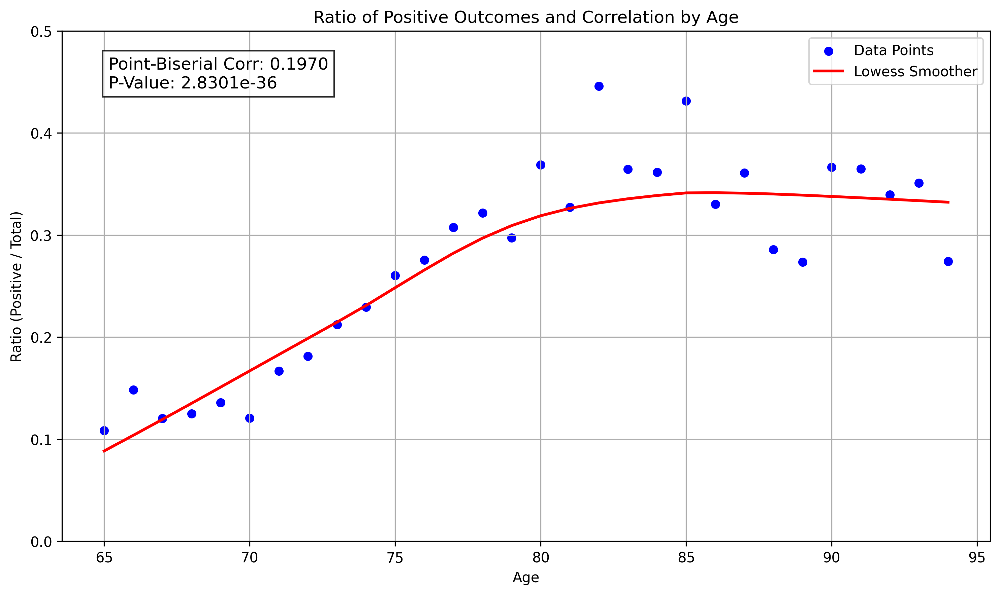

In [119]:
from scipy.stats import pointbiserialr

def plot_ratio_positive_negative_with_corr(df, continuous_var, categorical_var='target', positive_value=1, negative_value=0):
    grouped = df.groupby([continuous_var, categorical_var]).size().reset_index(name='count')
    pivot = grouped.pivot(index=continuous_var, columns=categorical_var, values='count').fillna(0)
    
    positive_counts = pivot[positive_value] if positive_value in pivot.columns else 0
    total_counts = positive_counts + pivot[negative_value] if negative_value in pivot.columns else positive_counts
    ratio = positive_counts / (total_counts + 1e-9)
    
    plot_df = pd.DataFrame({continuous_var: ratio.index, 'ratio_positive_negative': ratio.values})
    return plot_df, *pointbiserialr(df[continuous_var], df[categorical_var])

fig, ax = plt.subplots(figsize=(10, 6))

age_plot_df, age_corr, age_p = plot_ratio_positive_negative_with_corr(data, 'age', 'target')
sns.scatterplot(x='age', y='ratio_positive_negative', data=age_plot_df, color='blue', s=50, label='Data Points', ax=ax)
sns.regplot(x='age', y='ratio_positive_negative', data=age_plot_df, scatter=False, lowess=True, color='red', line_kws={'lw': 2}, label='Lowess Smoother', ax=ax)
ax.text(0.05, 0.95, f'Point-Biserial Corr: {age_corr:.4f}\nP-Value: {age_p:.4e}', transform=ax.transAxes, fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))
ax.set_title('Ratio of Positive Outcomes and Correlation by Age')
ax.set_xlabel('Age')
ax.set_ylabel('Ratio (Positive / Total)')
ax.set_ylim(0, 0.50)
ax.legend()
ax.grid()

plt.tight_layout()
plt.show()

From 65 to 80 we see this criteria satisfied very well, then even as age increased the apparent effect on outcome declines and thus violated the condition. Consequently, the model will produce greatest probability of response by age at the maximum when it's actually going to be at 82.

2. The association between the predictor variables and the outcome must be strong for the model to produce coefficients that reflect the strong observed association within the data and thus produce high probability predicted outcomes. 

3. How much a variable effects the outcome is dependent solely on that variable itself and independent of the state of others, they must be independent such that the predicted probability of outcome resembles the actual probability of outcome being modeled in that the variables are independent phenomenon present in the measurements of individuals from which we may infer how much each of those measurements contributed to the outcome given a large enough data set. 

### How do the results reflect how Logistic Regression works and how it consequently failed

In [120]:
data_sorted_lr = data.copy()
data_sorted_lr['predicted_probs'] = lr_model.predict_proba(X)[:, 1]
high_conf_preds = data_sorted_lr.nlargest(10, 'predicted_probs')
print(high_conf_preds[['age', 'income', 'dist', 'gender', 'marital_status','target', 'predicted_probs']].to_string())

      age  income  dist  gender  marital_status  target  predicted_probs
3917   94       2     1       1               1       0         0.648037
2393   94       2     2       1               1       1         0.645123
442    94       2     3       1               1       1         0.642198
862    90       1     2       1               1       0         0.627674
460    92       2     1       1               1       1         0.626457
2151   94       3     0       1               1       0         0.625239
264    90       1     5       1               1       0         0.618691
61     93       2     8       1               1       1         0.616442
1935   94       3     3       1               1       0         0.616234
31     92       2     7       1               1       0         0.608387


The observations with the highest predicted probability are those observations of which their variables are at the values which correspond to their respective linear terms being maximal. The highest predicted probability is only 64.8% because there was not a very strong pattern of responses increasing where the model is designed to expect them as it simply linearized the relationships between the variables and predicted outcome.

### What is the actual trend that predicts response as observed by the results of the Random Forest model? 

             age       dist     income     gender  marital_status
count  69.000000  69.000000  69.000000  69.000000       69.000000
mean   82.565217   4.231884   5.463768   0.710145        0.811594
std     4.347001   5.401919   2.997939   0.457019        0.393901
min    74.000000   0.000000   1.000000   0.000000        0.000000
25%    79.000000   0.000000   3.000000   0.000000        1.000000
50%    82.000000   2.000000   5.000000   1.000000        1.000000
75%    86.000000   5.000000   8.000000   1.000000        1.000000
max    93.000000  18.000000  11.000000   1.000000        1.000000
Male Results:
 age  dist  income  marital_status  predicted_probs
  80    16       4               1             0.99
  80    16       4               1             0.99
  77     5      11               1             0.98
  85     2      10               1             0.98
  85     2      10               1             0.98
  87     0       7               1             0.98
  77     5      11          

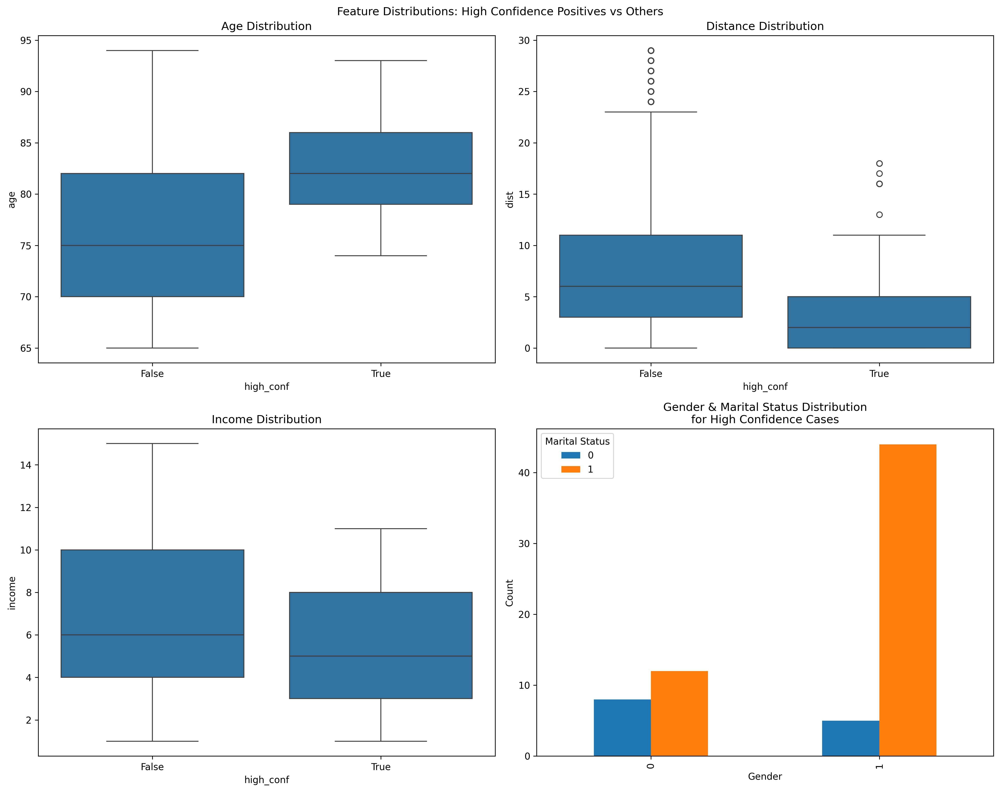

In [121]:
high_confidence_positives = data_sorted[data_sorted['predicted_probs'] > 0.9].copy()

summary_stats = high_confidence_positives[['age', 'dist', 'income', 'gender', 'marital_status']].describe()
print(summary_stats)


high_conf_combos = high_confidence_positives[['age', 'dist', 'income', 'gender', 'marital_status', 'predicted_probs']]
high_conf_combos = high_conf_combos.sort_values('predicted_probs', ascending=False).head(10)

male_results = high_conf_combos[high_conf_combos['gender'] == 1]
female_results = high_conf_combos[high_conf_combos['gender'] == 0]

print("Male Results:")
print(male_results[['age', 'dist', 'income', 'marital_status', 'predicted_probs']].to_string(index=False))
print("\nFemale Results:")
print(female_results[['age', 'dist', 'income', 'marital_status', 'predicted_probs']].to_string(index=False))

fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Feature Distributions: High Confidence Positives vs Others')

sns.boxplot(x='high_conf', y='age', 
           data=data_sorted.assign(high_conf=data_sorted['predicted_probs'] > 0.9),
           ax=axes[0,0])
axes[0,0].set_title('Age Distribution')

sns.boxplot(x='high_conf', y='dist',
           data=data_sorted.assign(high_conf=data_sorted['predicted_probs'] > 0.9),
           ax=axes[0,1])
axes[0,1].set_title('Distance Distribution')

sns.boxplot(x='high_conf', y='income',
           data=data_sorted.assign(high_conf=data_sorted['predicted_probs'] > 0.9),
           ax=axes[1,0])
axes[1,0].set_title('Income Distribution')

cat_data = data_sorted.assign(high_conf=data_sorted['predicted_probs'] > 0.9)
cat_data = cat_data[cat_data['high_conf']]
gender_marital_counts = pd.crosstab(cat_data['gender'], cat_data['marital_status'])
gender_marital_counts.plot(kind='bar', ax=axes[1,1])
axes[1,1].set_title('Gender & Marital Status Distribution\nfor High Confidence Cases')
axes[1,1].set_xlabel('Gender')
axes[1,1].set_ylabel('Count')
axes[1,1].legend(title='Marital Status')

plt.tight_layout()
plt.show()

The real pattern that was the predictor of response was married men aged 77-87 and women with with low distance, of which marital status was not significant. 

Logistic Regression actually did identify the trend of married men being responders, but only because it detected that in the aggregate of the data, not because it detected that for men marital status was a strong predictor and for women it was not like the random forest model did as evident by it's results. 

The Logistic Regression model simply produced high coefficients for marital_status and gender  (because male was encoded as 1 and so was married). Upon adding these interaction terms such that men and women had separate coefficients for marital status, the model barely improved as simply by identifying male and married as high predictors the difference was negligible to specifying the actual relationship to the end result.

Optimization terminated successfully.
         Current function value: 0.542901
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.535794
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.539265
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.541956
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.547609
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.559628
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.560484
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.545148
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.543849
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.558019
  

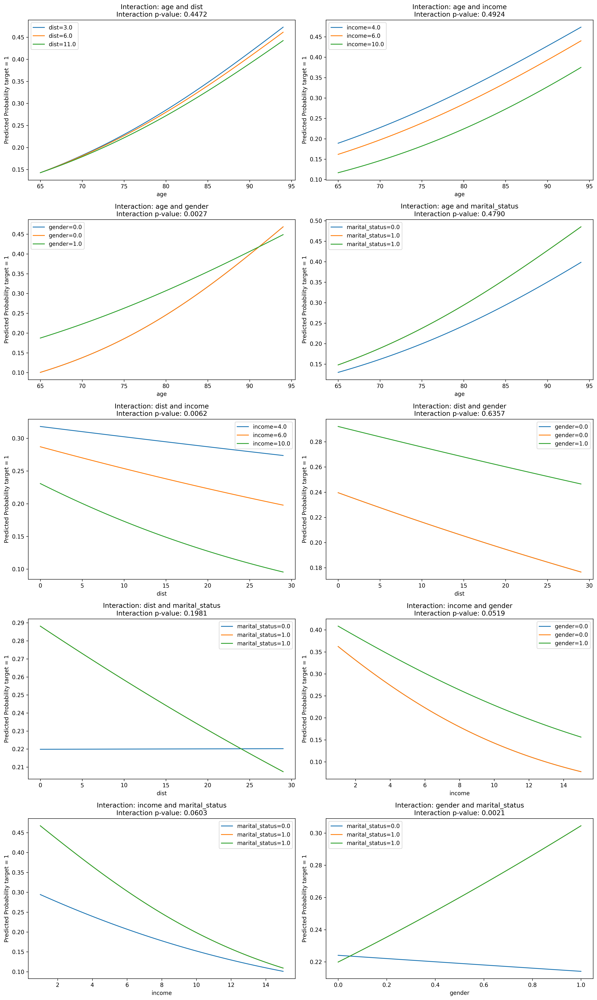


Significant interactions (p < 0.05):
age x gender
dist x income
gender x marital_status


In [122]:
variables = ['age', 'dist', 'income', 'gender', 'marital_status']

n_pairs = len(variables) * (len(variables) - 1) // 2
n_rows = (n_pairs + 1) // 2
fig, axes = plt.subplots(n_rows, 2, figsize=(15, 5*n_rows))
axes = axes.flatten()

significant_interactions = []
plot_idx = 0

for i, var1 in enumerate(variables):
    for j, var2 in enumerate(variables[i+1:], i+1):
        formula = f'target ~ {var1} * {var2}'
        model = sm.Logit.from_formula(formula, data=data).fit()
        
        interaction_pvalue = model.pvalues[f'{var1}:{var2}']
        
        if interaction_pvalue < 0.05:
            significant_interactions.append((var1, var2))
        
        var1_values = np.linspace(data[var1].min(), data[var1].max(), 100)
        var2_levels = np.percentile(data[var2], [25, 50, 75])
        
        for var2_level in var2_levels:
            df = pd.DataFrame({
                var1: var1_values,
                var2: var2_level
            })
            df['interaction'] = df[var1] * df[var2]
            df['predicted_prob'] = model.predict(sm.add_constant(df))
            
            axes[plot_idx].plot(df[var1], df['predicted_prob'], 
                              label=f'{var2}={var2_level:.1f}')
        
        axes[plot_idx].set_xlabel(var1)
        axes[plot_idx].set_ylabel('Predicted Probability target = 1')
        axes[plot_idx].legend()
        axes[plot_idx].set_title(f'Interaction: {var1} and {var2}\nInteraction p-value: {interaction_pvalue:.4f}')
        plot_idx += 1

for idx in range(plot_idx, len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

print("\nSignificant interactions (p < 0.05):")
for var1, var2 in significant_interactions:
    print(f"{var1} x {var2}")
